<a href="https://colab.research.google.com/github/MrckHckr/Cosmological_Models_Simulation/blob/main/CosmoSim.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Cosmological Models Simulation

In [20]:
# =========================
# 1. Librerie
# =========================
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from ipywidgets import interact, FloatSlider
import matplotlib.animation as animation
from IPython.display import HTML

# =========================
# 2. Funzioni modello
# =========================

G = 1  # unità semplificate

# Big Bang
def friedmann(t, a, rho0, Lambda, k):
    H2 = (8*np.pi*G/3)*rho0*(a[0]**-3) - k/(a[0]**2) + Lambda/3
    return [np.sqrt(H2)]

# Big Bounce
def big_bounce(t, a, rho0, rho_c):
    rho = rho0*(a[0]**-3)
    H2 = (8*np.pi*G/3)*rho*(1 - rho/rho_c)
    return [np.sqrt(np.abs(H2))]

# Inflazione (campo scalare)
def inflation(t, y, m):
    phi, phi_dot = y
    H = np.sqrt((phi_dot**2/2 + 0.5*m**2*phi**2)/3)
    return [phi_dot, -3*H*phi_dot - m**2*phi]

# =========================
# 3. Funzione per simulazioni
# =========================
def simulate_universe(rho0=1.0, Lambda=0.1, k=0, rho_c=10.0, m=0.1):
    t_eval = np.linspace(0, 20, 500)

    # Big Bang
    sol_bb = solve_ivp(friedmann, [0, 10], [0.01], t_eval=t_eval[:250], args=(rho0,Lambda,k))

    # Big Bounce
    sol_bbounce = solve_ivp(big_bounce, [0, 20], [0.01], t_eval=t_eval, args=(rho0,rho_c))

    # Inflazione
    y0 = [5.0,0.0]
    sol_infl = solve_ivp(inflation, [0, 20], y0, t_eval=t_eval, args=(m,))

    # Fluttuazioni quantistiche
    N = len(t_eval)
    phi_fluct = sol_infl.y[0] + np.random.normal(0, 0.05, N)

    # =========================
    # 4. Grafici
    # =========================
    plt.figure(figsize=(10,6))
    plt.plot(sol_bb.t, sol_bb.y[0], label="Big Bang - espansione standard")
    plt.plot(sol_bbounce.t, sol_bbounce.y[0], label="Big Bounce - rimbalzo")
    plt.plot(sol_infl.t, sol_infl.y[0], label="Inflazione - campo teta")
    plt.plot(t_eval, phi_fluct, label="Fluttuazioni quantistiche", alpha=0.5)
    plt.xlabel("Tempo t")
    plt.ylabel("Fattore di scala / phi(t)")
    plt.title("Simulazioni Cosmologiche Interattive")
    plt.legend()
    plt.show()

# =========================
# 5. Interattività
# =========================
interact(simulate_universe,
         rho0=FloatSlider(min=0.1,max=5.0,step=0.1,value=1.0, description='rho0 - densità materia'),
         Lambda=FloatSlider(min=0,max=1.0,step=0.01,value=0.1, description='Lambda - costante cosmologica'),
         k=FloatSlider(min=-1,max=1,step=1,value=0, description='Curvatura k'),
         rho_c=FloatSlider(min=5,max=20,step=1,value=10, description='Rho critico - densità critica per Big Bounce'),
         m=FloatSlider(min=0.01,max=0.5,step=0.01,value=0.1, description='Massa inflaton - massa campo inflatonico'))


interactive(children=(FloatSlider(value=1.0, description='rho0 - densità materia', max=5.0, min=0.1), FloatSli…

<function __main__.simulate_universe(rho0=1.0, Lambda=0.1, k=0, rho_c=10.0, m=0.1)>

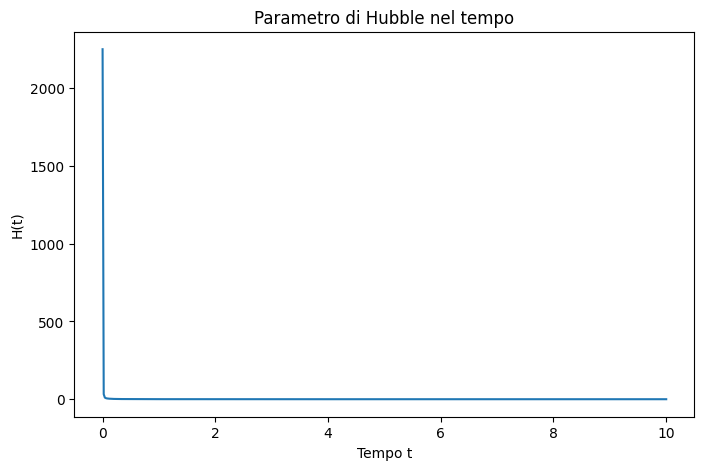

In [21]:
# =========================
# ESTENSIONE 1: Hubble H(t)
# =========================

# Calcolo numerico di a'(t)
a = sol_bb.y[0]
t = sol_bb.t
a_dot = np.gradient(a, t)

H = a_dot / a

plt.figure(figsize=(8,5))
plt.plot(t, H)
plt.xlabel("Tempo t")
plt.ylabel("H(t)")
plt.title("Parametro di Hubble nel tempo")
plt.show()


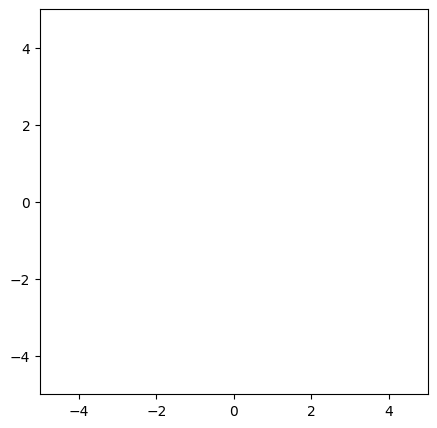

In [22]:
# =========================
# ESTENSIONE 2: Animazione
# =========================

fig, ax = plt.subplots(figsize=(5,5))
ax.set_xlim(-5,5)
ax.set_ylim(-5,5)

points, = ax.plot([], [], 'o')

# punti nello spazio
x0 = np.random.uniform(-1,1,100)
y0 = np.random.uniform(-1,1,100)

def init():
    points.set_data([], [])
    return points,

def update(frame):
    scale = a[frame]
    x = x0 * scale
    y = y0 * scale
    points.set_data(x, y)
    return points,

ani = animation.FuncAnimation(
    fig, update, frames=len(a),
    init_func=init, interval=40
)

HTML(ani.to_jshtml())

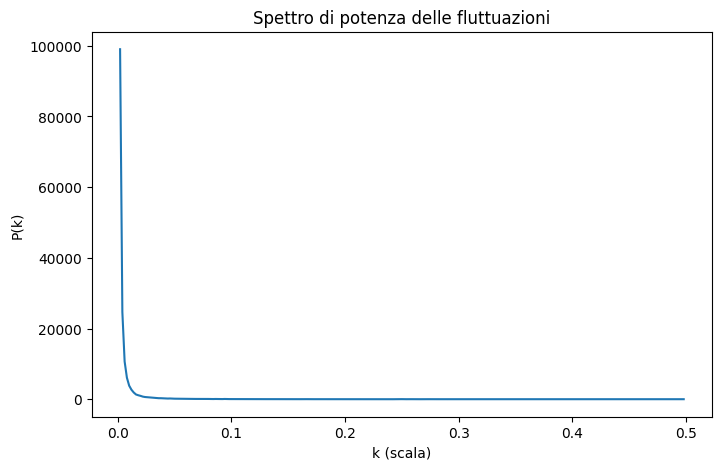

In [23]:
# =========================
# ESTENSIONE 3: Power Spectrum
# =========================

# Segnale: fluttuazioni del campo inflatonico
signal = phi_fluct - np.mean(phi_fluct)

# Trasformata di Fourier
fft_vals = np.fft.fft(signal)
power = np.abs(fft_vals)**2

# Frequenze
k = np.fft.fftfreq(len(power))

# Solo parte positiva
mask = k > 0

plt.figure(figsize=(8,5))
plt.plot(k[mask], power[mask])
plt.xlabel("k (scala)")
plt.ylabel("P(k)")
plt.title("Spettro di potenza delle fluttuazioni")
plt.show()